In [8]:
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

In [9]:
# RGB image frame
RGB_IMAGE_PATH = "Assignment/rgb_frame.png"
RGB_IMAGE = plt.imread(RGB_IMAGE_PATH)

# Disparity image
DISPARITY_IMAGE_PATH = "Assignment/Disparity.png"
DISPARITY_IMAGE = plt.imread(DISPARITY_IMAGE_PATH)

# camera intrinsic matrix
CAMERA_INTRINSIC_MATRIX = np.array([
                    [398.7956237792969, 0.0,          315.4751892089844],
                    [0.0,        398.7956237792969,   205.1688232421875],
                    [0.0,               0.0,                          1]
                    ])

# distance between the sterio camera centers
BASELINE = 0.075 #m



#Transformation matrix from camera to base frame is a 3x4 matrix of the form[R|t], R=Rotation, t=Translation.
T_BF_CAM= [
           [ 0.0,  0.0, 1.0,  0.28],
           [-1.0,  0.0, 0.0,  0.0375],
           [ 0.0, -1.0, 0.0,  0.28]
           ]

In [10]:
""" 
    camera_intrinsic_matrix = [
                                [f_x, 0, c_x],
                                [0, f_y, c_y],
                                [0, 0, 1]
                                ]
"""

def disparity_to_point(disparity, camera_intrinsic_matrix, baseline, thresold=None):
    f_x = camera_intrinsic_matrix[0, 0]
    f_y = camera_intrinsic_matrix[1, 1]
    c_x = camera_intrinsic_matrix[0, 2]
    c_y = camera_intrinsic_matrix[1, 2]

    if thresold == None:
        thresold = disparity.min()
    
    n_rows, n_columns = disparity.shape
    points = []

    for v in range(n_rows):
        for u in range(n_columns):
            d = disparity[v, u]
            if d > thresold:
                z = (f_x * baseline) / d
                x = (u - c_x) * z / f_x
                y = (v - c_y) * z / f_y
                points.append([x, y, z])
                
    return np.array(points)

In [11]:

def transform_points(transformation_matrix, point_cloud): # point_cloud shape: (N, 3), transformation_matrix shape: (3,4)

    point_cloud = np.hstack((point_cloud, np.ones((point_cloud.shape[0], 1)))) # homogeneous
    point_cloud = (np.dot(transformation_matrix, point_cloud.T)).T
    
    return point_cloud

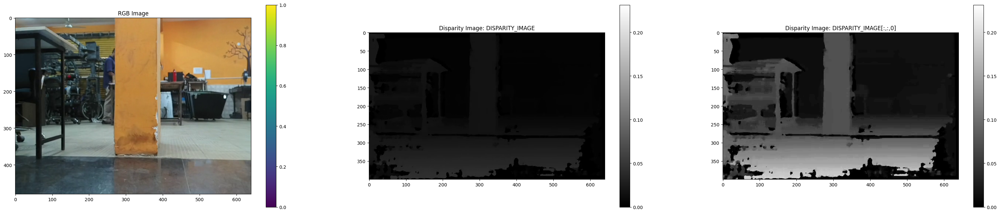

In [12]:
# Debug plot of disparity image
plt.figure(figsize=(640/16.3, 400/50))

plt.subplot(1,3,1)
plt.imshow(RGB_IMAGE)
plt.title("RGB Image")
plt.colorbar()


plt.subplot(1,3,2)
plt.imshow(DISPARITY_IMAGE, cmap='gray')
plt.title("Disparity Image: DISPARITY_IMAGE")
plt.colorbar()


plt.subplot(1,3,3)
plt.imshow(DISPARITY_IMAGE[:,:,0], cmap='gray')
plt.title("Disparity Image: DISPARITY_IMAGE[:,:,0]")
plt.colorbar()
plt.show()

## Point cloud in Camera Frame

In [13]:
# Since each channel of disparity (400,640,3) is same. So using first channel 
THRESOLD = (np.mean(DISPARITY_IMAGE[:,:,0]) - 0.5*np.std(DISPARITY_IMAGE[:,:,0]))
points_cloud_camera = disparity_to_point(DISPARITY_IMAGE[:,:,0], CAMERA_INTRINSIC_MATRIX, BASELINE, thresold=THRESOLD)

points_cloud_camera_scaled = (points_cloud_camera-np.min(points_cloud_camera))/(np.max(points_cloud_camera)-np.min(points_cloud_camera))


| view plane | elev | azim |
|------------|------|------|
| XY         | 90   | -90  |
| XZ         | 0    | -90  |
| YZ         | 0    | 0    |
| -XY        | -90  | 90   |
| -XZ        | 0    | 90   |


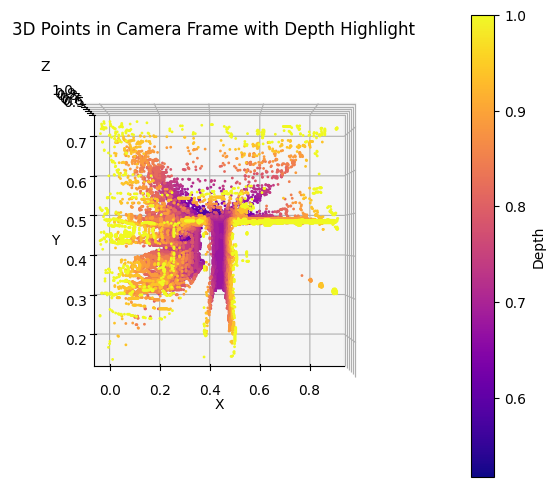

In [14]:
fig = plt.figure(figsize=(7, 6))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(points_cloud_camera_scaled[:, 0], points_cloud_camera_scaled[:, 1], points_cloud_camera_scaled[:, 2], c=points_cloud_camera_scaled[:, 2], cmap='plasma', s=1, alpha=1.0)

cbar = plt.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label("Depth")
ax.set_title("3D Points in Camera Frame with Depth Highlight")
ax.set_xlabel("X")

ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.view_init(elev=90, azim=-90)
# plt.savefig("Assignment/camera_frame.png")


# Base Frame

In [15]:
point_cloud_base = transform_points(transformation_matrix=T_BF_CAM, point_cloud=points_cloud_camera)
point_cloud_base_scaled = point_cloud_base/np.max(point_cloud_base, axis=0) # scaling between 0 and 1

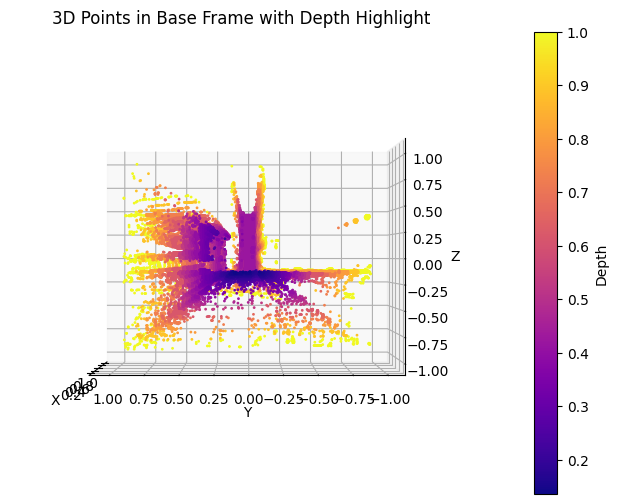

In [16]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(point_cloud_base_scaled[:, 0], point_cloud_base_scaled[:, 1], point_cloud_base_scaled[:, 2], c=point_cloud_base_scaled[:, 0], cmap='plasma', s=1, alpha=1.0)

cbar = plt.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label("Depth")
ax.set_title("3D Points in Base Frame with Depth Highlight")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.view_init(elev=0, azim=180)
# plt.savefig("Assignment/base_frame.png")
plt.show()

In [17]:
from plotly import graph_objects as go
fig = go.Figure(data=[go.Scatter3d(
    x=points_cloud_camera_scaled[:, 0],
    y=points_cloud_camera_scaled[:, 1],
    z=points_cloud_camera_scaled[:, 2],
    mode="markers",
    marker=dict(size=1, color=points_cloud_camera_scaled[:, 0], colorscale="plasma", opacity=0.8)
)])

fig.update_layout(
    title="Camera Frame",
    scene = dict(
        xaxis = dict(title="X"),
        yaxis = dict(title="Y"),
        zaxis= dict(title="Z")
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)
fig.show()


# Rotation matrix

In [18]:
# theta_x = np.pi/2
# theta_z = np.pi/2

# R_x = np.array([[1, 0, 0],
#                 [0, np.cos(theta_x), np.sin(theta_x)],
#                 [0, -np.sin(theta_x), np.cos(theta_x)]])

# R_z = np.array([[np.cos(theta_z), np.sin(theta_z), 0],
#                 [-np.sin(theta_z), np.cos(theta_z), 0],
#                 [0, 0, 1]])

# R = R_z@R_x

# transformation_matrix = np.hstack((R, np.zeros((R.shape[0],1))))


# # R_y = np.array([[np.cos(theta_y), 0, -np.sin(theta_y)],
# #                 [0, 1, 0],
# #                 [np.sin(theta_y), 0, np.cos(theta_y)]
# #                 ])
# points_cloud_camera = transform_points(R, point_cloud=points_cloud_camera)
# points_cloud_camera_scaled = points_cloud_camera/np.max(points_cloud_camera)
# fig = plt.figure(figsize=(7, 6))
# ax = fig.add_subplot(111, projection='3d')
# sc = ax.scatter(points_cloud_camera_scaled[:, 0], points_cloud_camera_scaled[:, 1], points_cloud_camera_scaled[:, 2], c=points_cloud_camera_scaled[:, 0], cmap='plasma', s=1, alpha=1.0)

# cbar = plt.colorbar(sc, ax=ax, pad=0.1)
# cbar.set_label("Depth")
# ax.set_title("Point Cloud in Camera Frame")
# ax.set_xlabel("X")
# ax.set_ylabel("Y")
# ax.set_zlabel("Z")
# # ax.view_init(elev=0, azim=180)
# # plt.savefig("Assignment/camera_frame.png")
